# Maps with Cartopy

In [10]:
%matplotlib inline

import numpy as np
import pandas as pd

import warnings

# Make inline plots vector graphics instead of raster graphics
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() # sets seaborn default "prettyness:

import cartopy
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader

from pathlib import Path

import random 
random.seed(2)

## Plot points on a map

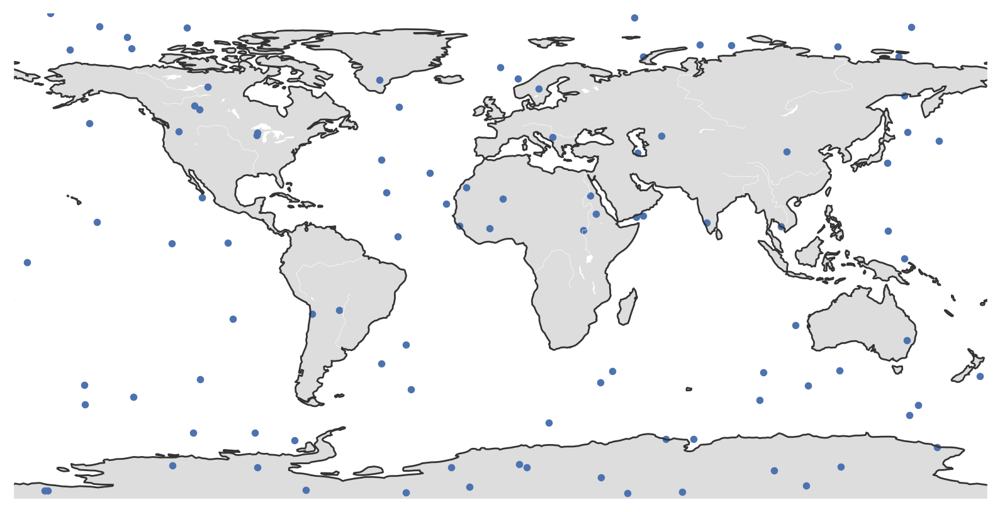

In [3]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_facecolor('white')

ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)

np.random.seed(1)
lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90

ax.scatter(lon, lat, s=10, transform=ccrs.PlateCarree())

ax.coastlines(color='#333333') ;

## Works for different projections

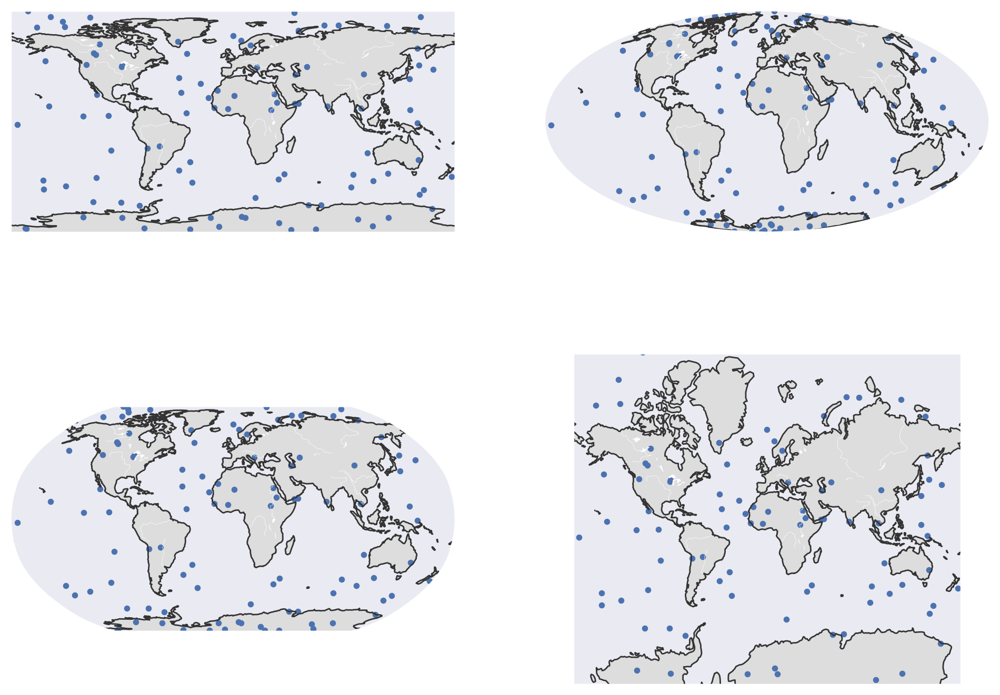

In [4]:
np.random.seed(1)
lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90

fig = plt.figure(figsize=(12,9))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.PlateCarree())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.PlateCarree())
# set visible part of the world (default is plotted part)
ax.set_global()
ax.coastlines(color='#333333') ;

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Mollweide())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.PlateCarree())
ax.set_global()
ax.coastlines(color='#333333') ;

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Robinson())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.PlateCarree())
ax.set_global()
ax.coastlines(color='#333333') ;

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Mercator())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.PlateCarree())
ax.set_global()
ax.coastlines(color='#333333') ;


#plt.tight_layout()

## Borders, rivers, lakes, and sea

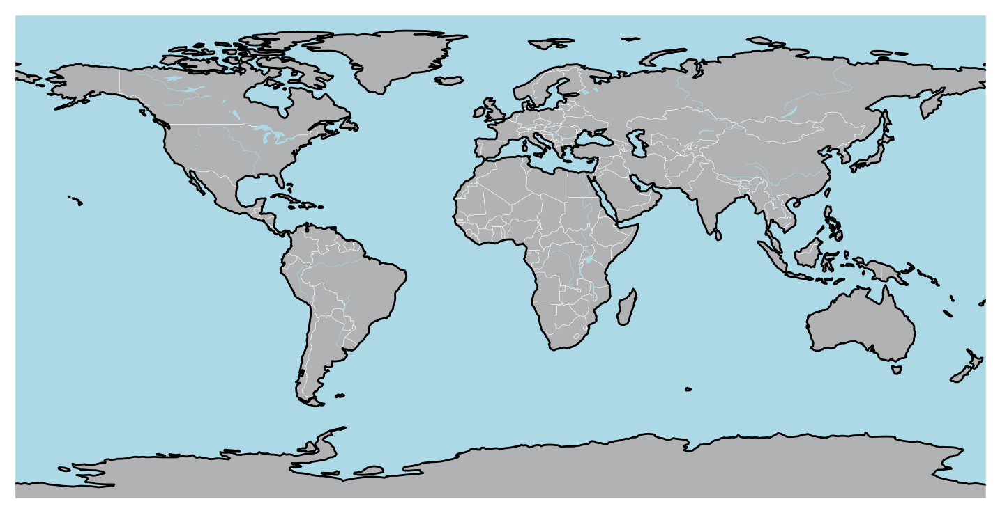

In [5]:

plt.close()

projection = ccrs.PlateCarree()

fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)

ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.001, facecolor='#B1B2B4')
ax.add_feature(cartopy.feature.OCEAN, facecolor='lightblue')
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.RIVERS, edgecolor='lightblue', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='lightblue', linewidth=.25)

ax.coastlines(color='black')
#ax.outline_patch.set_edgecolor('white')

# set visible part of the world (default is plotted part)
ax.set_global()

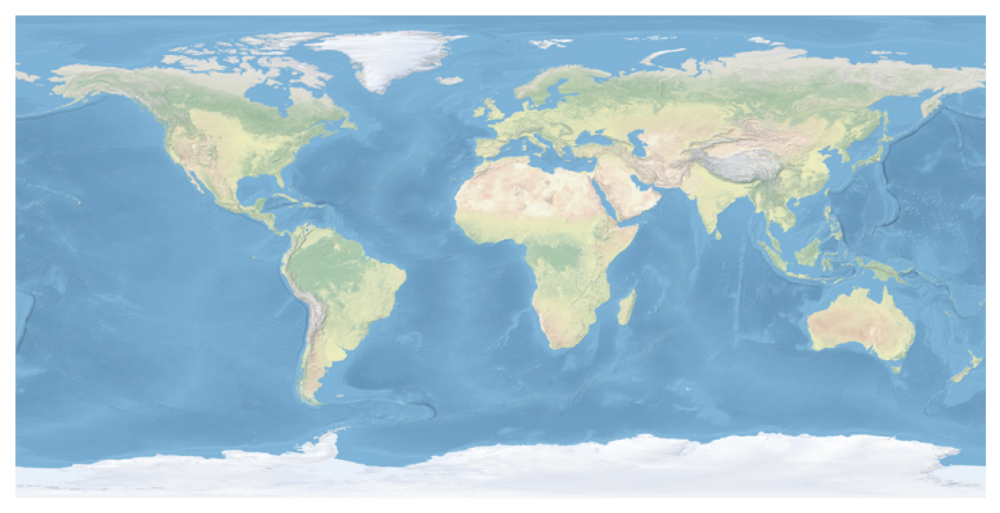

In [6]:
projection = ccrs.PlateCarree()

fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)

ax.stock_img()

# set visible part of the world (default is plotted part)
ax.set_global()

## Different views of the globe

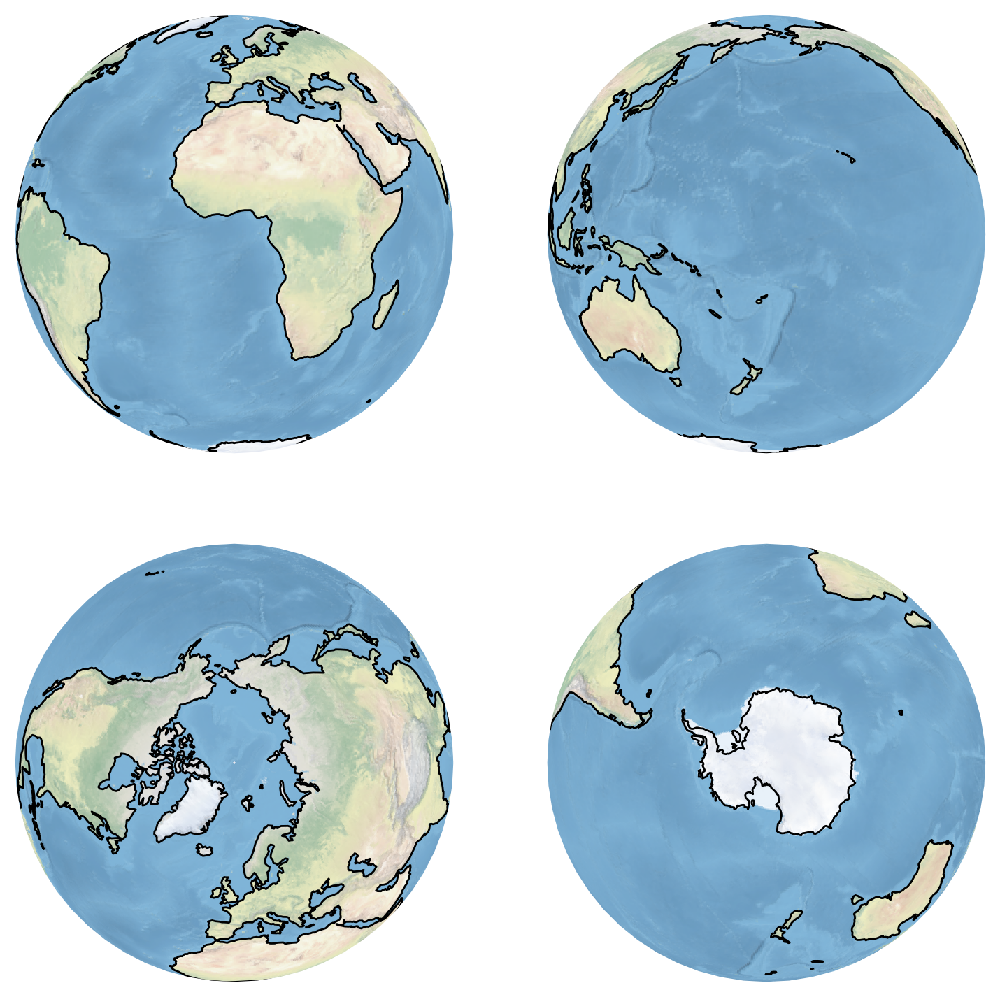

In [7]:
resolution='110m'
fig = plt.figure(figsize=(9,9))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Orthographic(central_longitude=180.0, central_latitude=0.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=90.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=-90.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution) ;

## Centered on Denmark

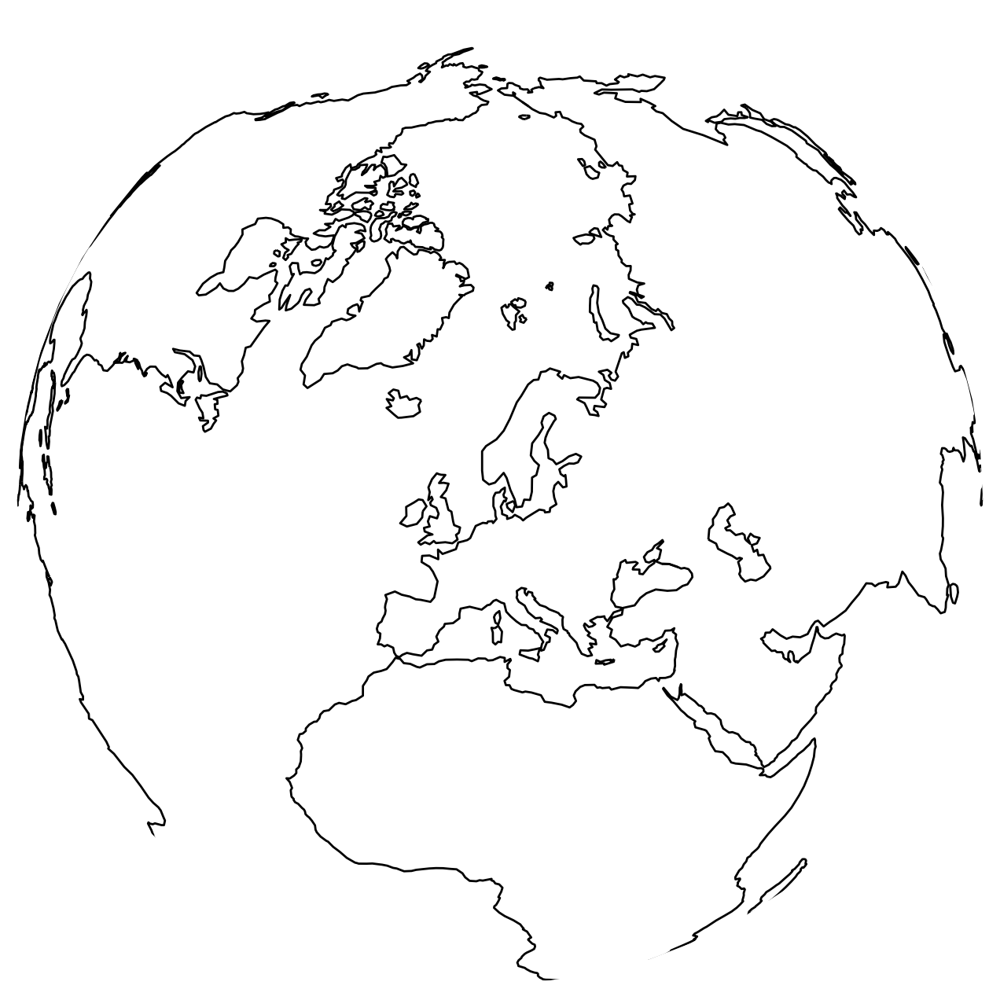

In [8]:
fig = plt.figure(figsize=(8,8))
resolution='110m'
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(central_longitude=9.5018, central_latitude=56.2639))
ax.set_facecolor('white')
#plt.setp(ax.spines.values(), color='grey') # set outline if missing
ax.set_global()
ax.coastlines(color='black', resolution=resolution)
ax.set_global()

## Centered on middle east

24.7136° N, 46.6753°

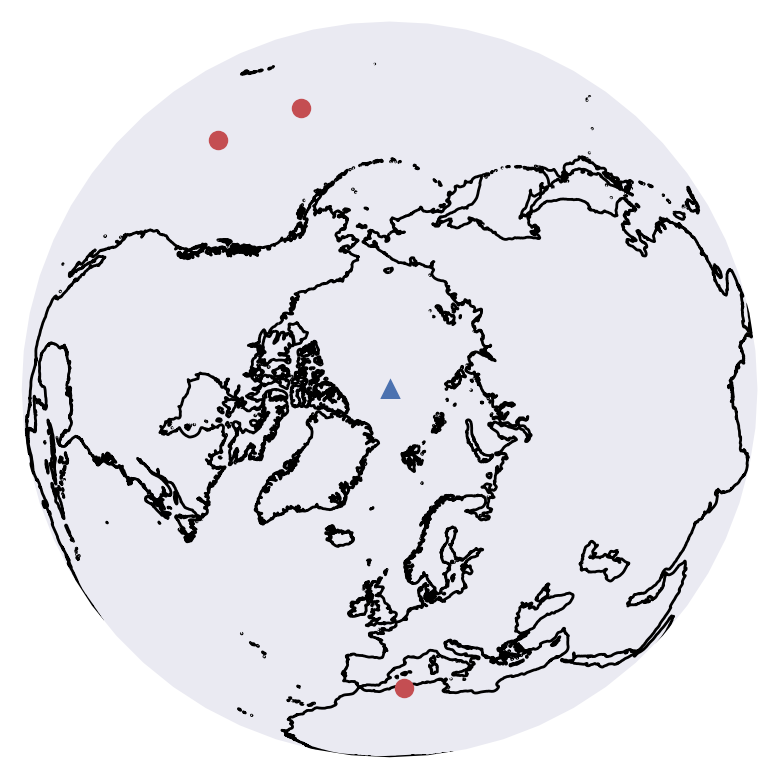

In [58]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# create the lat/lon points
lons = np.array([214.5, 2.7, 197.5])
lats = np.array([35, 36, 37.])

# create the projections
ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

# create the geoaxes for an orthographic projection
ax = plt.axes(projection=ortho)

# transform lat/lons points to othographic points
points = ortho.transform_points(geo, lons, lats)

# plot native orthographic points                                                                                
ax.plot(points[:, 0], points[:, 1], 'ro')

# plot north pole for reference (with a projection transform)                                                                                           
ax.plot([0], [90], 'b^', transform=geo)

# add coastlines for reference                                                                                                
ax.coastlines(resolution='50m')
ax.set_global()

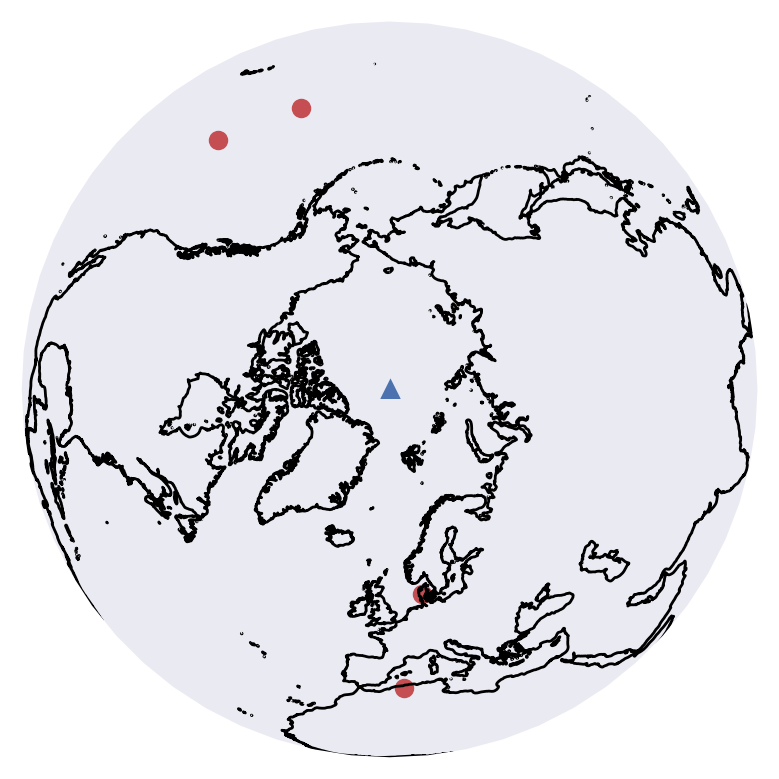

In [71]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# create the lat/lon points
lons = np.array([214.5, 2.7, 197.5, 9])
lats = np.array([35, 36, 37., 56])


# create the projections
ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

# create the geoaxes for an orthographic projection
ax = plt.axes(projection=ortho)

# plot native orthographic scatter points                                                                                
ax.scatter(lons, lats, marker='o', c='r', transform=geo)

# plot north pole for reference                                                                                               
ax.plot([0], [90], 'b^', transform=geo)

# add coastlines for reference                                                                                                
ax.coastlines(resolution='50m')
ax.set_global()

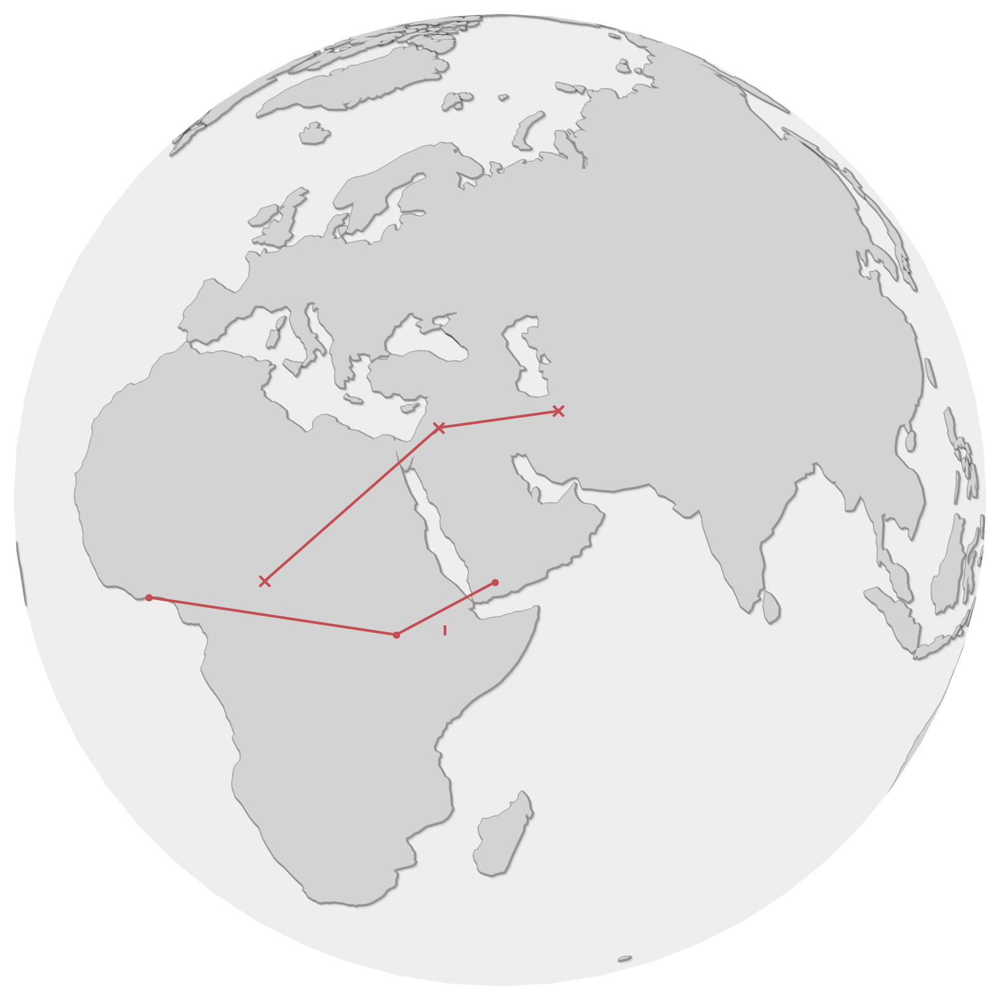

In [31]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs


from matplotlib import patheffects

def drop_shadow(scale=1):
    return [patheffects.SimpleLineShadow(alpha=a, offset=(o,-o), linewidth=2) for a, o in \
            [(0.3, scale*0.5), (0.1, scale*1), (0.05, scale*1.5), (0.05, scale*2)] ] + [patheffects.Normal()]

# create the lat/lon points
homo_lat = np.array([12, 33, 35])
homo_lon = np.array([17, 38, 55])
baboon_lat = np.array([5.5, 8.07, 15])
baboon_lon = np.array([0.2, 34.17, 46])
awash_lat = np.array([9])
awash_lon = np.array([40])

# lat = np.array([5.5, 9, 8.07, 15, 12, 33, 35])
# lon = np.array([0.2, 40, 34.17, 46, 17, 38, 53])

# create the projections
ortho = ccrs.Orthographic(central_longitude=46.6, central_latitude=24.7)
geo = ccrs.Geodetic()

fig = plt.figure(figsize=(10,10))
resolution='110m'

# create the geoaxes for an orthographic projection
ax = plt.axes(projection=ortho)
ax.set_facecolor('white')
#plt.setp(ax.spines.values(), color='grey') # set outline if missing
ax.set_global()

ax.add_feature(cartopy.feature.OCEAN, facecolor='#eeeeee')

# ax.coastlines(color='#666666', resolution=resolution, linewidth=0.5)
ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5, path_effects=drop_shadow(scale=0.7), zorder=0)

ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.0005, facecolor='lightgrey') ;

# plot native orthographic scatter points                                                                                
ax.scatter(baboon_lon, baboon_lat, marker='.', c='r', transform=geo)
ax.scatter(homo_lon, homo_lat, marker='x', c='r', transform=geo)
ax.plot(baboon_lon, baboon_lat, marker='.', c='r', transform=geo)
ax.plot(homo_lon, homo_lat, marker='x', c='r', transform=geo)
ax.scatter(awash_lon, awash_lat, marker='|', c='r', transform=geo)

ax.set_global()

plt.savefig('fnu_lines.pdf')

## from matplotlib import patheffects

def drop_shadow(scale=1):
    return [patheffects.SimpleLineShadow(alpha=a, offset=(o,-o), linewidth=2) for a, o in \
            [(0.3, scale*0.5), (0.1, scale*1), (0.05, scale*1.5), (0.05, scale*2)] ] + [patheffects.Normal()]

fig = plt.figure(figsize=(10,10))
resolution='110m'
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(central_longitude=46.6, central_latitude=24.7))
ax.set_facecolor('white')
#plt.setp(ax.spines.values(), color='grey') # set outline if missing
ax.set_global()

ax.add_feature(cartopy.feature.OCEAN, facecolor='#eeeeee')

# ax.coastlines(color='#666666', resolution=resolution, linewidth=0.5)
ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5, path_effects=drop_shadow(scale=0.7), zorder=0)

ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.0005, facecolor='lightgrey') ;

lon_lat =[
    (9, 40),
    (5.5, 0.2),
    (0, 0),
(9.5018, 56.2639)
]
lon, lat = list(zip(*lon_lat))

ax.scatter(lon, lat, s=10, c='red', transform=ccrs.Orthographic(central_longitude=46.6, central_latitude=24.7))
ax.set_global()


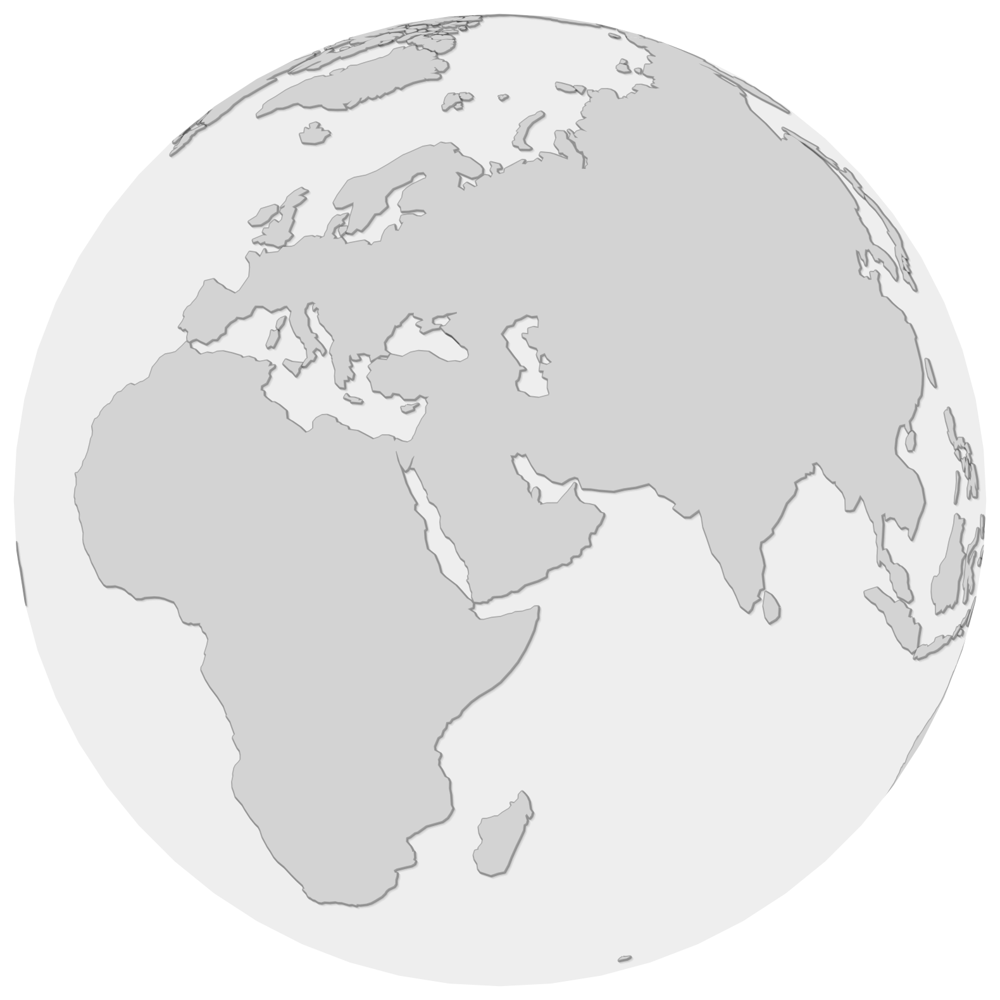

In [60]:
from matplotlib import patheffects

def drop_shadow(scale=1):
    return [patheffects.SimpleLineShadow(alpha=a, offset=(o,-o), linewidth=2) for a, o in \
            [(0.3, scale*0.5), (0.1, scale*1), (0.05, scale*1.5), (0.05, scale*2)] ] + [patheffects.Normal()]

# create the projections
ortho = ccrs.Orthographic(central_longitude=46.6, central_latitude=24.7)
geo = ccrs.Geodetic()

fig = plt.figure(figsize=(10,10))
resolution='110m'


# create the geoaxes for an orthographic projection
ax = plt.axes(projection=ortho)

ax.set_facecolor('white')
#plt.setp(ax.spines.values(), color='grey') # set outline if missing
ax.set_global()

ax.add_feature(cartopy.feature.OCEAN, facecolor='#eeeeee')

# ax.coastlines(color='#666666', resolution=resolution, linewidth=0.5)
ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5, path_effects=drop_shadow(scale=0.7), zorder=0)

ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.0005, facecolor='lightgrey') ;


lon_lat =[
    (9, 40),
    (5.5, 0.2),
    (0, 0),
(9.5018, 56.2639)
]
lon, lat = list(zip(*lon_lat))


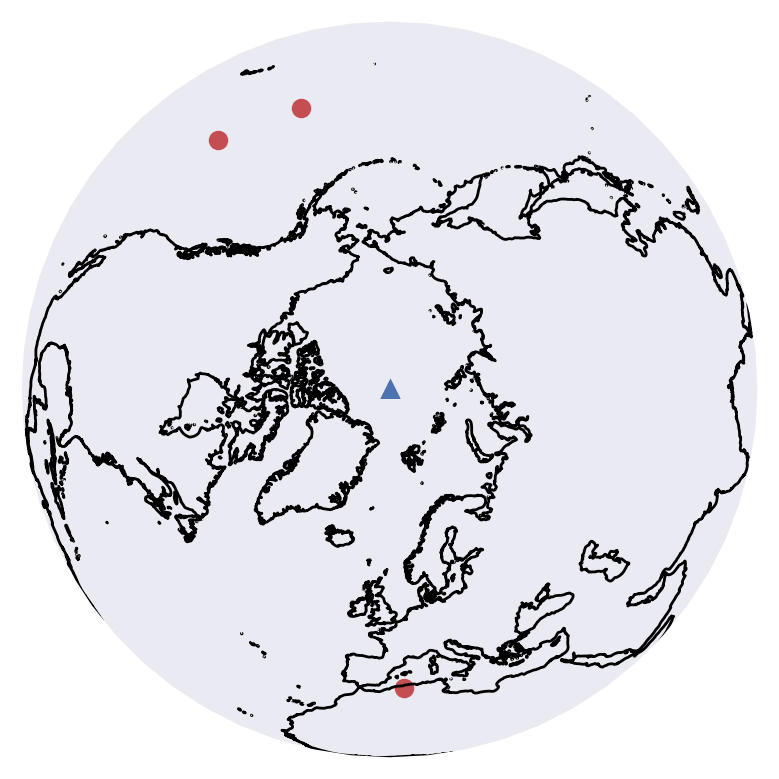

## Denmark

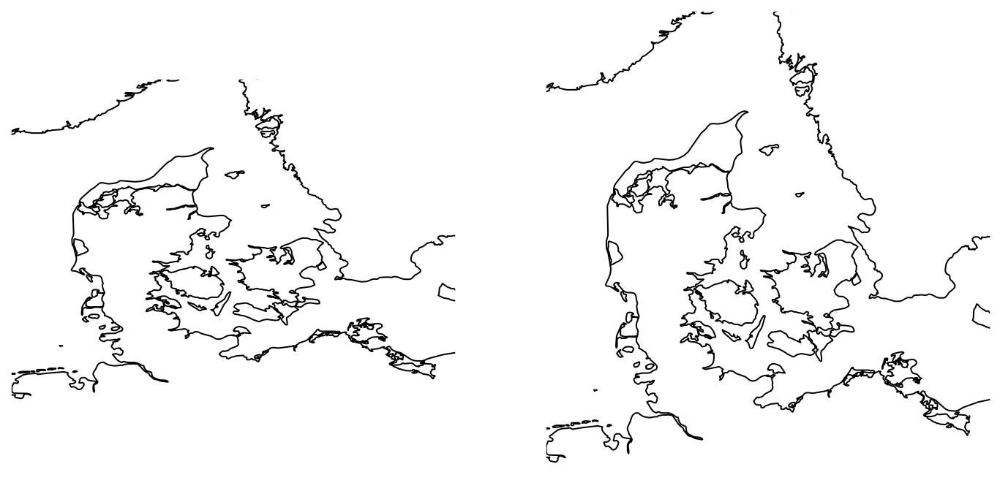

In [9]:
fig = plt.figure(figsize=(12,6))

ax = fig.add_subplot(1, 2, 1, projection=ccrs.PlateCarree())
ax.set_facecolor('white')
#plt.setp(ax.spines.values(), color='grey') # set border in newer versions

ax.coastlines(color='black', resolution='10m')
ax.set_extent([7, 15, 53, 59], crs= ccrs.PlateCarree())

ax = fig.add_subplot(1, 2, 2, projection=ccrs.Miller())
ax.set_facecolor('white')
#plt.setp(ax.spines.values(), color='grey') # set border in newer versions

ax.coastlines(color='black', resolution='10m')
ax.set_extent([7, 15, 53, 59], crs= ccrs.PlateCarree())

## Show a geographical region

/var/folders/33/sv_s_4ps2gjgpwdxjvz9jly00000gn/T/ipykernel_4471/58058994.py:24: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax.outline_patch.set_edgecolor('grey') # set border in older versions


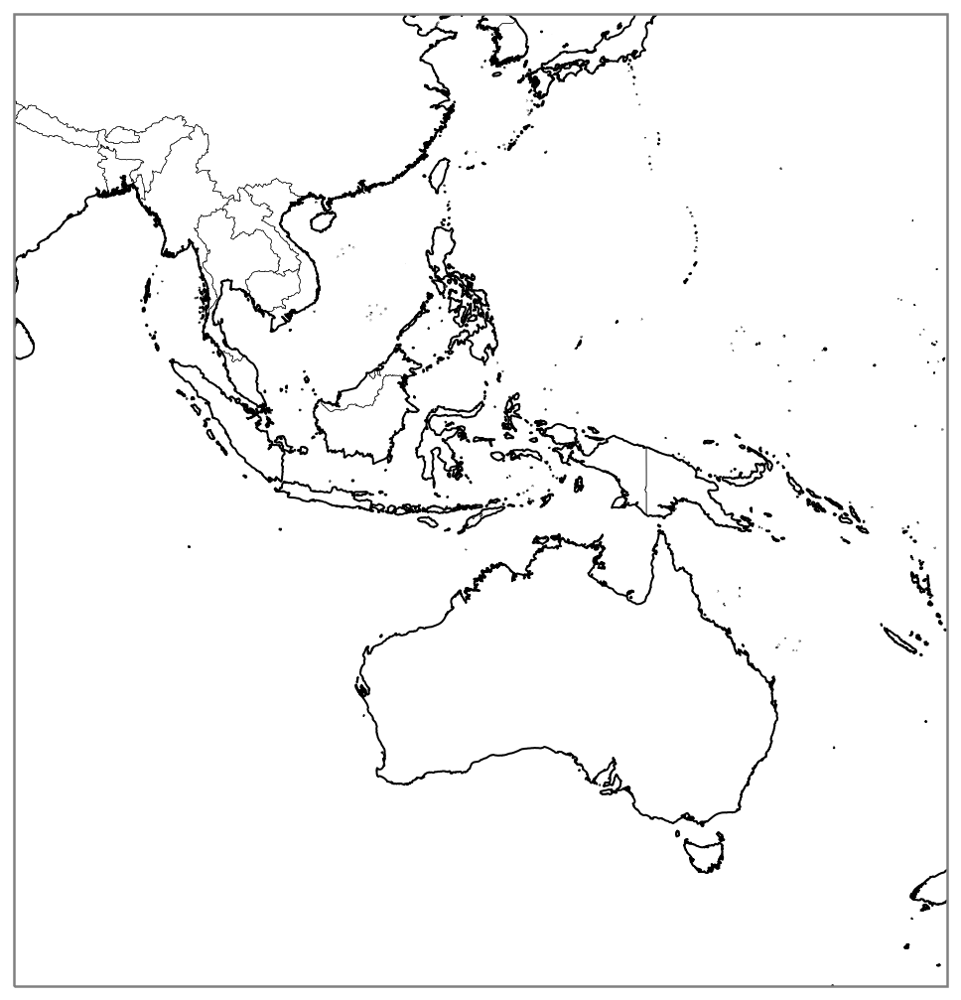

In [10]:
# map figure
projection = ccrs.PlateCarree()
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
resolution='10m'
#resolution='50m'
#resolution='110m'
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)
ax.set_facecolor('white')


# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))

# ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'populated_places',  color='red', edgecolor='red',
#                                                     facecolor='red', scale=resolution), zorder=4)

# frame of map
ax.outline_patch.set_edgecolor('grey') # set border in older versions
#plt.setp(ax.spines.values(), color='grey') # set border in newer versions

ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_extent([80, 170, -45, 30])
#ax.set_extent([-20, 40, 30, 70])

## Pretty clean map

/var/folders/33/sv_s_4ps2gjgpwdxjvz9jly00000gn/T/ipykernel_4471/3619997547.py:9: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax.outline_patch.set_edgecolor('white') # set border in older versions


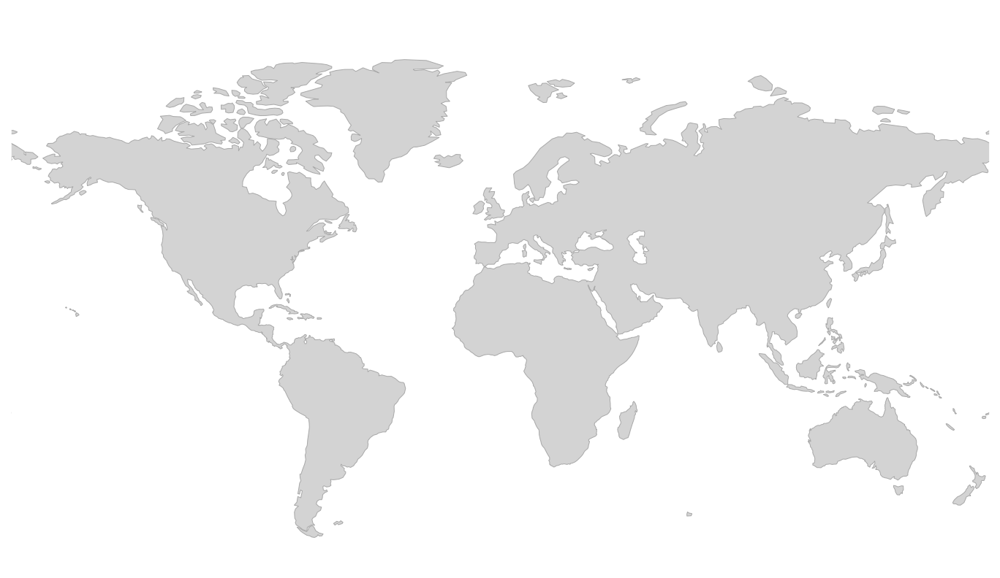

In [11]:
projection=ccrs.Miller()
resolution='110m'
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(1, 1, 1, projection=projection)
ax.set_facecolor('white')
ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5)
ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.001, facecolor='lightgrey')

ax.outline_patch.set_edgecolor('white') # set border in older versions
#plt.setp(ax.spines.values(), color='white') # set border in newer versions

ax.set_extent([-170, 180, 90, -63])

##  Drop shadow

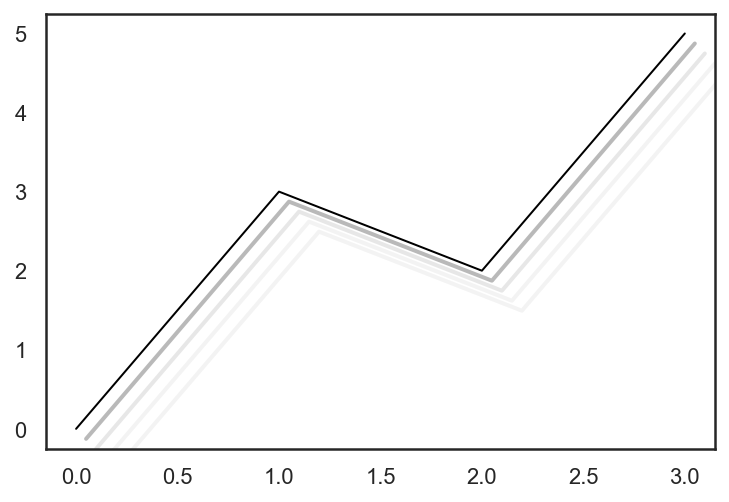

In [12]:
from matplotlib import patheffects

def drop_shadow(scale=1):
    return [patheffects.SimpleLineShadow(alpha=a, offset=(o,-o), linewidth=2) for a, o in \
            [(0.3, scale*0.5), (0.1, scale*1), (0.05, scale*1.5), (0.05, scale*2)] ] + [patheffects.Normal()]

with sns.axes_style('white'):
    plt.plot([0, 3, 2, 5], linewidth=1, color='black', path_effects=drop_shadow(scale=10))

/var/folders/33/sv_s_4ps2gjgpwdxjvz9jly00000gn/T/ipykernel_4471/3144246745.py:9: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax.outline_patch.set_edgecolor('white') # set border in older versions


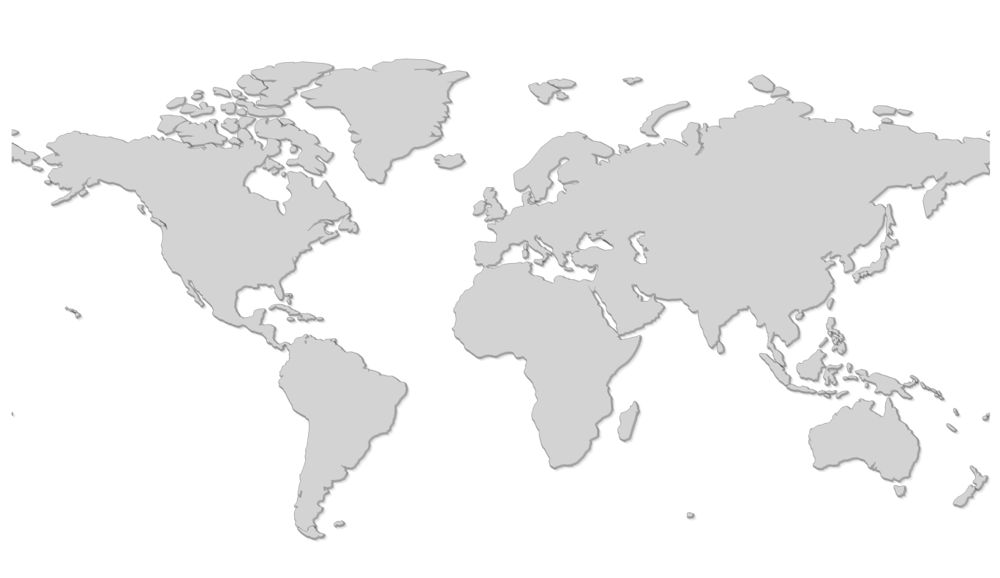

In [13]:
projection=ccrs.Miller()
resolution='110m'
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(1, 1, 1, projection=projection)
ax.set_facecolor('white')
ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5, path_effects=drop_shadow(), zorder=0)
ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.001, facecolor='lightgrey')

ax.outline_patch.set_edgecolor('white') # set border in older versions
#plt.setp(ax.spines.values(), color='white') # set border in newer versions

ax.set_extent([-179, 180, 90, -63])

## Five color mapping

### Backtracking Algorithm

The idea is to assign colors one by one to different vertices, starting from the vertex 0. Before assigning a color, we check for safety by considering already assigned colors to the adjacent vertices. If we find a color assignment which is safe, we mark the color assignment as part of solution. If we do not a find color due to clashes then we backtrack and return false.

In [14]:
def get_country_colors(resolution):

    # neigboring countries
    # https://en.wikipedia.org/wiki/List_of_political_and_geographic_borders
    countries_df = pd.read_table('../metadata/countries.csv', sep=';').fillna('')

    neighbors = dict()
    for tup in countries_df.itertuples():
        lst = tup.Neighbors.split(' / ')
        if lst == ['']:
            lst = []
        neighbors[tup.Country] = lst

    nr_countries = len(neighbors)
    countries = sorted(neighbors)

    # graph matrix of neighbors
    graph = pd.DataFrame(dict((x, [0]*nr_countries) for x in countries), index=countries)
    for c, n in neighbors.items():
        l = [x for x in n if x in countries]
        graph.loc[l, c] = 1


    # country shape info
    shpfilename = shpreader.natural_earth(resolution=resolution,
                                          category='cultural',
                                          name='admin_0_countries')
    reader = shpreader.Reader(shpfilename)
    records = reader.records()
    
    
#     records = cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
#                                                    facecolor='none',
#                                                    linewidth=.25,
#                                                    scale=resolution).geometries()
    
    info = dict((r.attributes['NAME_LONG'], r) for r in records)

    # five map colors
    #colors = ['pink', 'lightgreen', 'lightblue', 'orange', 'yellow']
    colors = ['#EEEEEE', '#E8E8E8', '#DDDDDD', '#D8D8D8', '#CCCCCC']

    # get order in which countries should be colored
    stack = list()
    while len(graph):
        assert graph.sum().min() < 5
        country = graph.sum().idxmin()
        stack.append(country)
        graph.drop(country, axis=0, inplace=True)
        graph.drop(country, axis=1, inplace=True)

    def get_color(name, already_colored):
        lst = list()
        for n in neighbors[name]:
            if n in already_colored:
                lst.append(already_colored[n])    
        return random.choice([x for x in colors if x not in lst])

    # color countries popped off stack
    country_colors = dict()
    for name in reversed(stack):
        country_colors[name] = get_color(name, country_colors)
        
    return info, country_colors

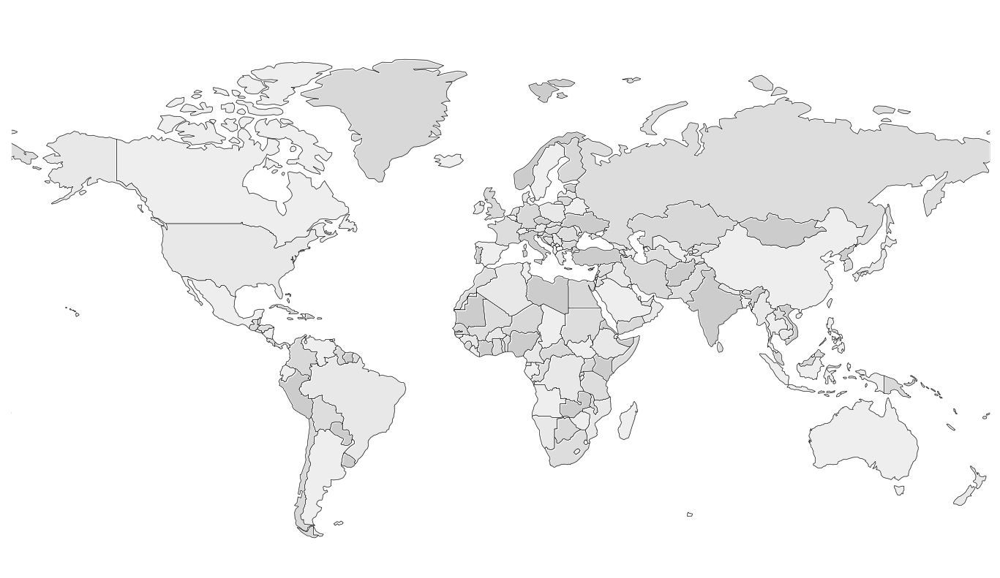

In [15]:
projection=ccrs.Miller()
#resolution='10m' 
#resolution='50m'
resolution='110m'
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(1, 1, 1, projection=projection)
ax.set_facecolor('white')

info, country_colors = get_country_colors(resolution)

for name, color in country_colors.items():
    try:
        country = info[name]
    except KeyError:        
        continue
    ax.add_geometries([country.geometry], ccrs.PlateCarree(), facecolor=color, label=name)

ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5)

# borders
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))
#ax.outline_patch.set_edgecolor('white') # set border in older versions
plt.setp(ax.spines.values(), color='white') # set border in newer versions

# set visible part of the world (default is plotted part)
ax.set_extent([-179, 180, 90, -63])

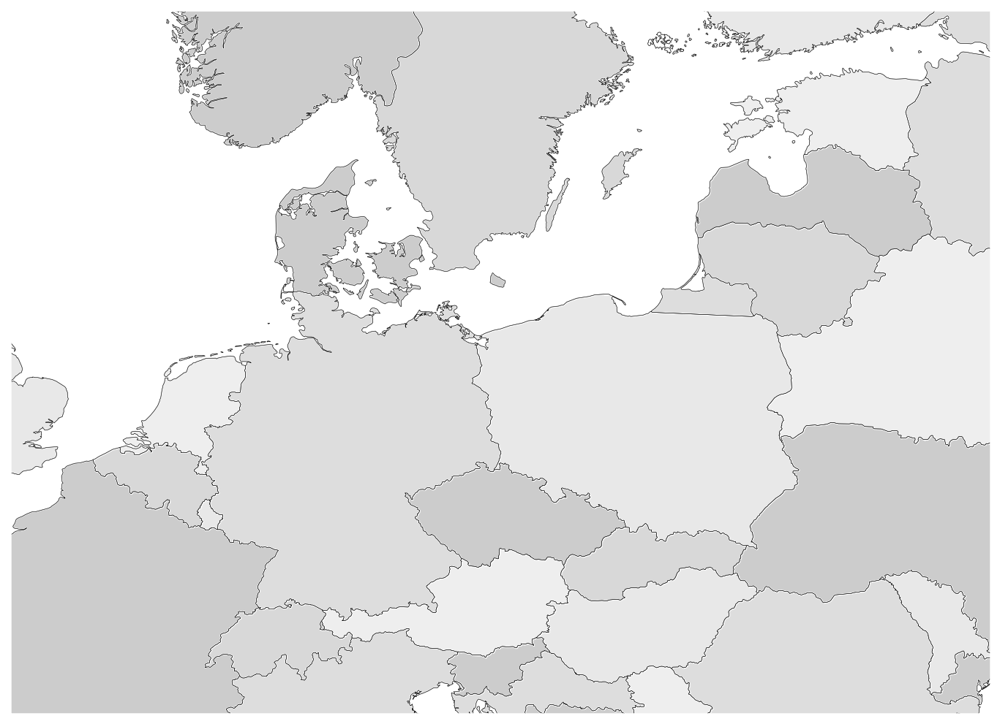

In [16]:
projection=ccrs.Miller()
resolution='10m' 
#resolution='50m'
#resolution='110m'
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(1, 1, 1, projection=projection)
ax.set_facecolor('white')

info, country_colors = get_country_colors(resolution)

for name, color in country_colors.items():
    try:
        country = info[name]
    except KeyError:        
        continue
    ax.add_geometries([country.geometry], ccrs.PlateCarree(), facecolor=color, label=name)

ax.coastlines(color='darkgrey', resolution=resolution, linewidth=0.5)

# borders
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))
#ax.outline_patch.set_edgecolor('white') # set border in older versions
plt.setp(ax.spines.values(), color='white') # set border in newer versions

# set visible part of the world (default is plotted part)
ax.set_extent([0, 30, 60,45])

/var/folders/33/sv_s_4ps2gjgpwdxjvz9jly00000gn/T/ipykernel_4471/1885350503.py:39: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax.outline_patch.set_edgecolor('grey') # set border in older versions


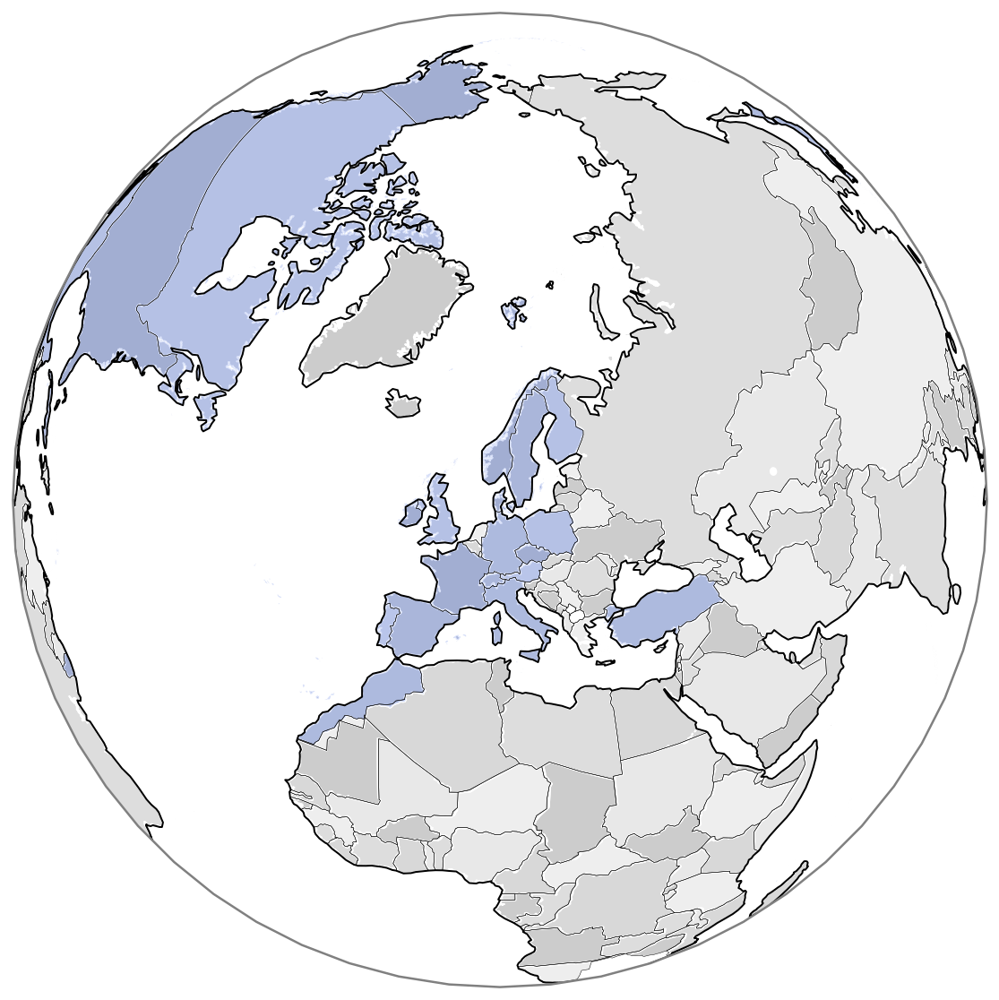

In [17]:
# map figure
#projection = ccrs.PlateCarree()
#projection=ccrs.Miller()
projection=ccrs.Orthographic(central_longitude=9.5018, central_latitude=56.2639)
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
#resolution='10m' 
#resolution='50m'
resolution='110m'
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1, projection=projection)
ax.set_facecolor('white')

for name, color in country_colors.items():
    try:
        country = info[name]
    except KeyError:        
        continue
    ax.add_geometries([country.geometry], ccrs.PlateCarree(), facecolor=color, label=name)

# shade blue of countries I have been to 
where_i_have_been = ['Denmark', 'Germany', 'Sweden', 'Norway', 'Finland', 'United Kingdom', 'Ireland',
                     'Poland', 'France', 'Austria', 'Switzerland', 'Spain', 'Portugal', 'Italy', 'Czech Republic', 
                     'Morocco', 'Turkey', 'Cuba', 'United States', 'Canada', 'Mexico', 'Japan']
for name in where_i_have_been:
    color='royalblue'
    country = info[name]
    ax.add_geometries([country.geometry], ccrs.PlateCarree(),
                      facecolor=color,
                      label=name, alpha=0.3)
    
# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))
# frame of map
ax.outline_patch.set_edgecolor('grey') # set border in older versions
#plt.setp(ax.spines.values(), color='grey') # set border in newer versions)

# coastline
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_global()

## Facets with seaborn

In [18]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import cartopy.crs
import cartopy.feature

In [19]:
df = pd.read_table('../metadata/urbanareas.tsv')
df = pd.melt(df, id_vars=['City', 'City_Alternate', 'Country', 'Latitude', 'Longitude', 'Country_ISO3'],
             value_name='Population')
df['Year'] = df['variable'].str.slice(3, 7).astype(int)
df['PopulationCategory'] = pd.cut(df['Population'], [0, 1000, 2000, 3000, 5000, 100000], right=False)

In [20]:
df.head()

,City,City_Alternate,Country,Latitude,Longitude,Country_ISO3,variable,Population,Year,PopulationCategory
0,Sofia,NaN,Bulgaria,42.70,23.33,BGR,pop1950,520.0,1950,"[0, 1000)"
1,Mandalay,NaN,Myanmar,21.97,96.08,MMR,pop1950,170.0,1950,"[0, 1000)"
2,Nay Pyi Taw,NaN,Myanmar,19.75,96.10,MMR,pop1950,0.0,1950,"[0, 1000)"
3,Yangon,Rangoon,Myanmar,16.87,96.12,MMR,pop1950,1300.0,1950,"[1000, 2000)"
4,Minsk,NaN,Belarus,53.89,27.57,BLR,pop1950,280.0,1950,"[0, 1000)"


/Users/kmt/miniconda3/envs/maps/lib/python3.9/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/var/folders/33/sv_s_4ps2gjgpwdxjvz9jly00000gn/T/ipykernel_4471/2245102962.py:16: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax.outline_patch.set_edgecolor('white')


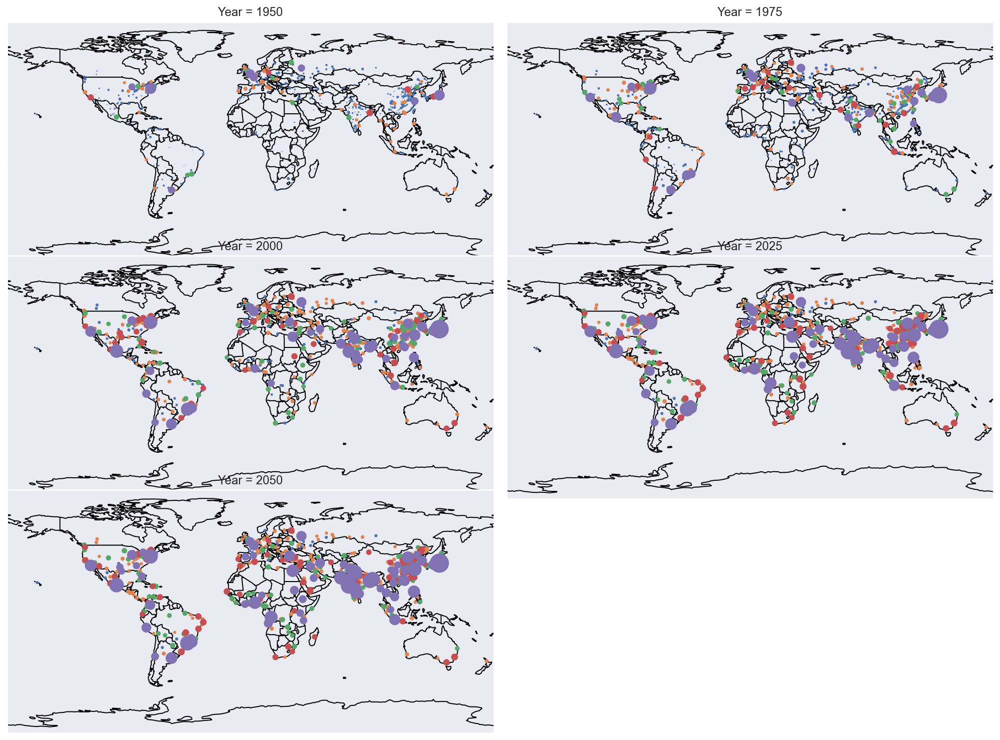

In [21]:
def scatterplot(x, y, s, color=None, **kwargs):
    # the default plt.scatter handles size scaling poorly, so we define our own
    # see also: https://github.com/mwaskom/seaborn/issues/315
    scaled_size = 0.01 * s
#     plt.scatter(x, y, s=scaled_size, edgecolor=color, facecolor='none', linewidth=1, **kwargs)
    plt.scatter(x, y, s=scaled_size, edgecolor='none', linewidth=1, **kwargs)

g = sns.FacetGrid(df[df['Year'] % 25 == 0], col="Year", hue='PopulationCategory',
                  col_wrap=2, size=3.5, aspect=2, palette="Set1",#sns.dark_palette('Red', 5),
                  subplot_kws=dict(projection=cartopy.crs.PlateCarree()))
g.map(scatterplot, "Longitude", "Latitude", "Population",
      transform=cartopy.crs.PlateCarree(), zorder=10)
for ax in g.axes.ravel():
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.add_feature(cartopy.feature.BORDERS)
    ax.outline_patch.set_edgecolor('white')
    #plt.setp(ax.spines.values(), color='white')
    ax.set_global()

# Maps with Geoplot

In [22]:
import geoplot as gplt
import geoplot.crs as gcrs
import geopandas as gpd

world = gpd.read_file(
    gpd.datasets.get_path('naturalearth_lowres')
)

# or:
# world_midres = gpd.read_file(
#     '../natural_earth/50m_cultural/ne_50m_admin_0_countries.shp'
# )
# world_midres.columns
# world_midres['continent'] = world_midres.CONTINENT
# world_midres['name'] = world_midres.NAME_EN

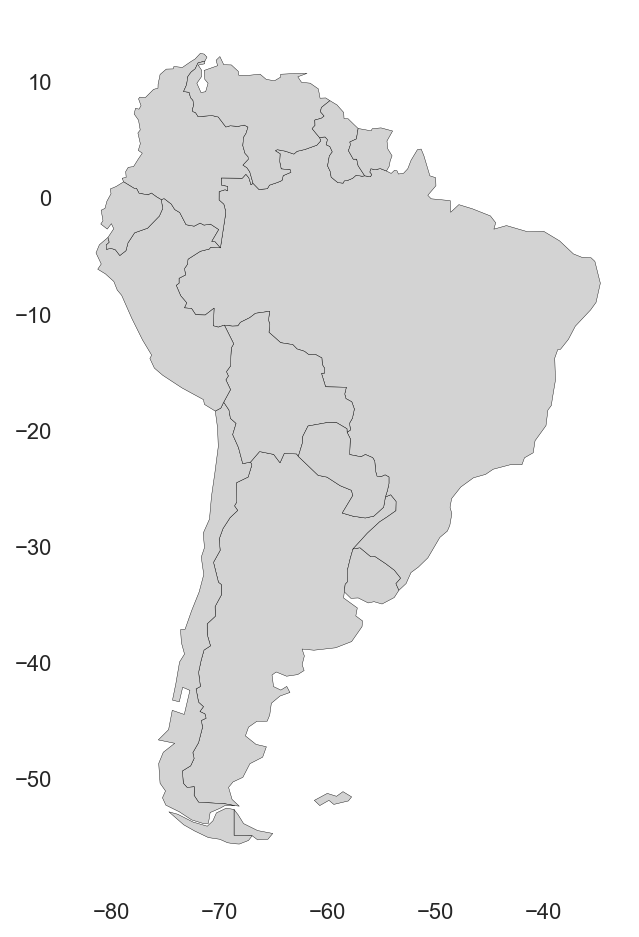

In [23]:
ax = world[world.continent == 'South America'].plot(
    edgecolor='black', 
    facecolor='lightgray',
    linewidth=0.2,
    figsize=(8, 8))
ax.set_facecolor('white')

/Users/kmt/miniconda3/envs/maps/lib/python3.9/site-packages/geoplot/geoplot.py:903: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for subgeom in geom:


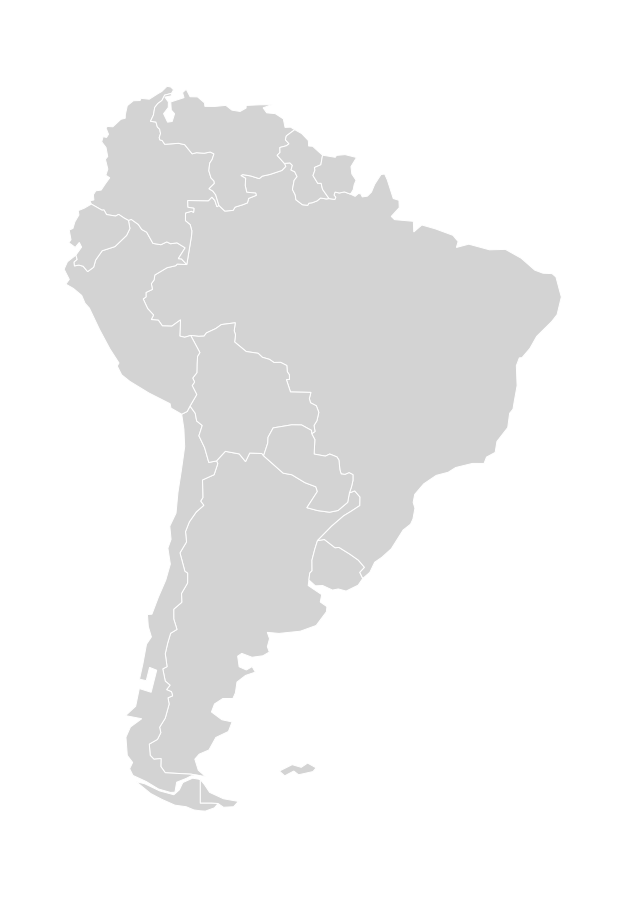

In [24]:
continent = world[world.continent == 'South America']
ax = gplt.polyplot(continent,
    edgecolor='white', 
    facecolor='lightgray',
    linewidth=0.5,
    figsize=(8, 8))
ax.set_facecolor('white')

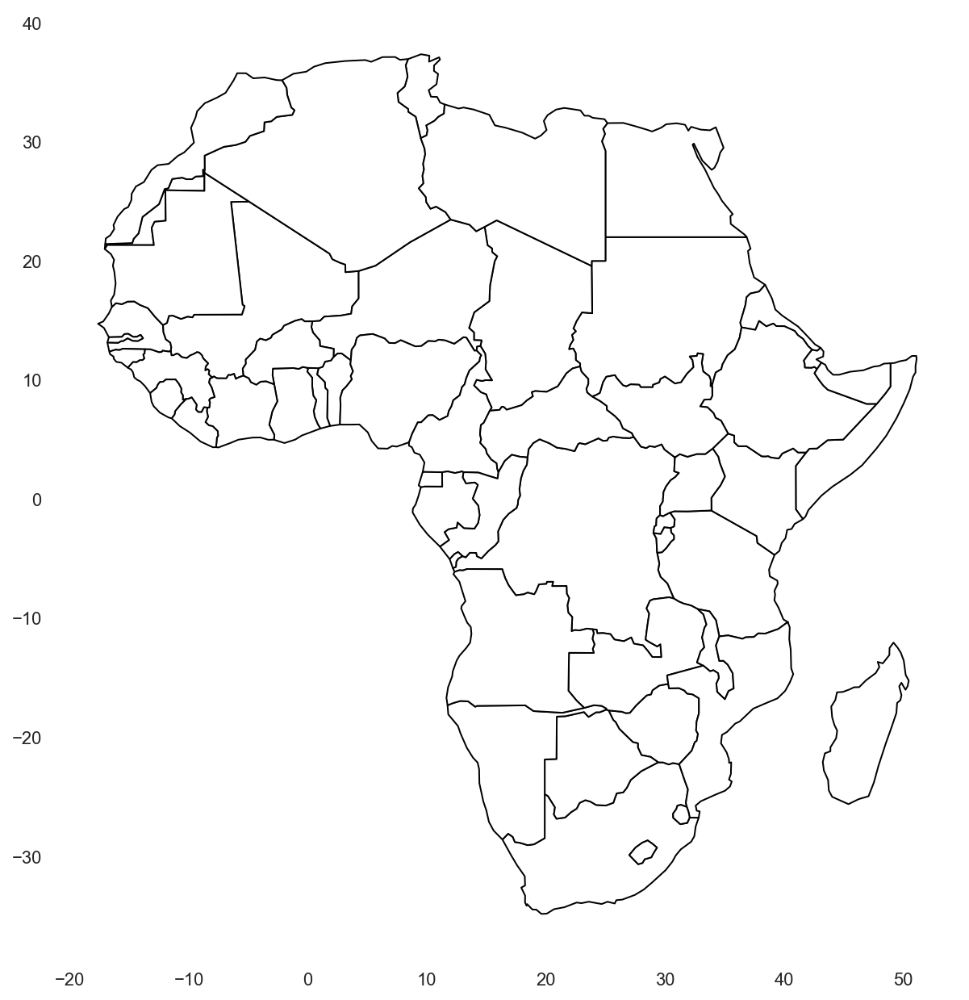

In [25]:
ax = world[world.continent == 'Africa'].plot(
    color='white', edgecolor='black',  figsize=(10, 12))
ax.set_facecolor('white')

In [40]:
np.random.seed(1)
lon = 360 * np.random.rand(1000) - 180
lat = 180 * np.random.rand(1000) - 90

df = pd.DataFrame(dict(lon=lon, lat=lat, val=np.random.rand(1000)))

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf.head()

,lon,lat,val,geometry
0,-29.872078,-31.354206,0.576978,POINT (-29.87208 -31.35421)
1,79.316818,70.168921,0.875389,POINT (79.31682 70.16892)
2,-179.958825,45.307390,0.608565,POINT (-179.95883 45.30739)
3,-71.160274,47.273777,0.251660,POINT (-71.16027 47.27378)
4,-127.167879,-5.493775,0.296130,POINT (-127.16788 -5.49377)


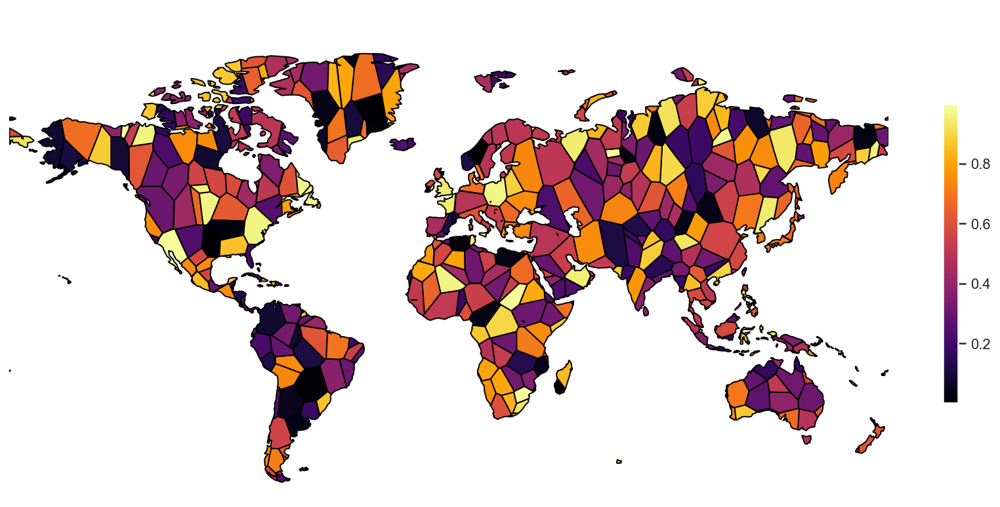

In [27]:
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=UserWarning)

    world = gpd.read_file(
        gpd.datasets.get_path('naturalearth_lowres')
    )

    scheme = None#mc.NaturalBreaks(gdf['val'], k=10)
    ax = gplt.voronoi(
        gdf, projection=gcrs.Miller(),
        clip=world.simplify(0.001),
        hue='val', scheme=scheme, cmap='inferno',
        legend=True,
        legend_kwargs=dict(shrink=0.6),
        figsize=(15, 7)
    )
    sc = gplt.polyplot(world, ax=ax, projection=gcrs.Miller(),
                       extent=(-180, -60, 180, 90), edgecolor='lightgray', facecolor='lightgrey', linewidth=0.2)

    ax.set_facecolor('white') ;

In [28]:
warnings.filterwarnings("ignore", category=UserWarning)

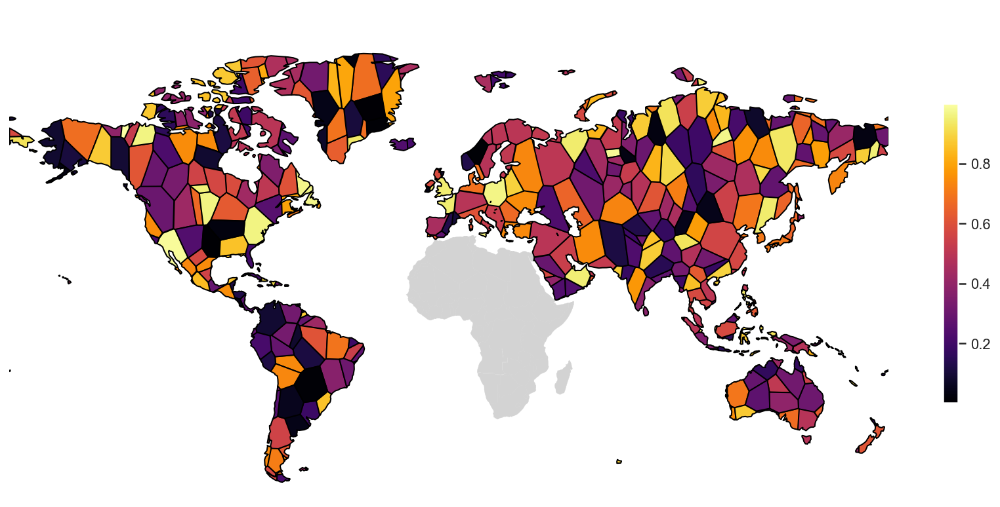

In [29]:
world = gpd.read_file(
    gpd.datasets.get_path('naturalearth_lowres')
)

non_africa = ax = world[world.continent != 'Africa']

scheme = None#mc.NaturalBreaks(gdf['val'], k=10)
ax = gplt.voronoi(
    gdf, projection=gcrs.Miller(),
    clip=non_africa.simplify(0.001),
    hue='val', scheme=scheme, cmap='inferno',
    legend=True,
    legend_kwargs=dict(shrink=0.6),
    figsize=(15, 7)
)
sc = gplt.polyplot(world, ax=ax, projection=gcrs.Miller(),
                   extent=(-180, -60, 180, 90), edgecolor='lightgray', facecolor='lightgrey', linewidth=0.2)

ax.set_facecolor('white') ;

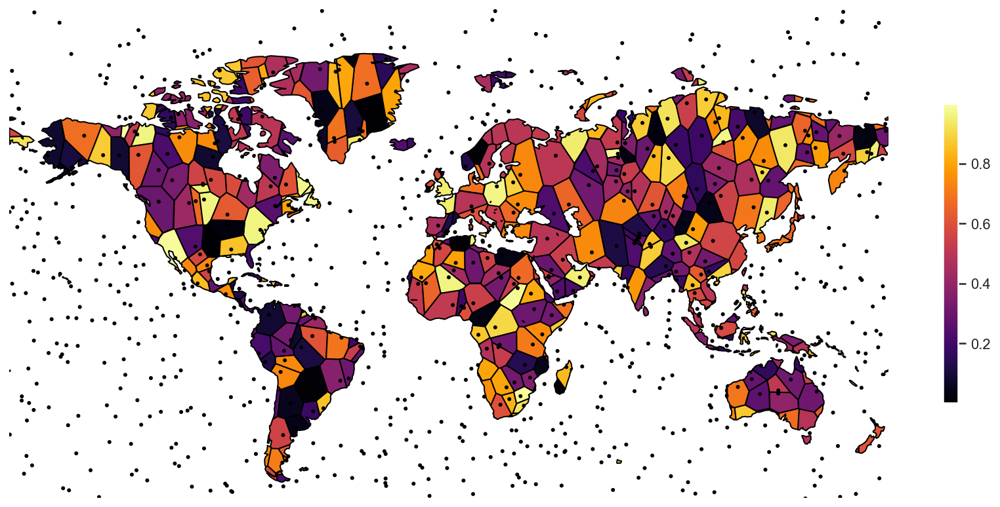

In [30]:
world = gpd.read_file(
    gpd.datasets.get_path('naturalearth_lowres')
)

scheme = None#mc.NaturalBreaks(gdf['val'], k=10)
ax = gplt.voronoi(
    gdf, projection=gcrs.Miller(),
    clip=world.simplify(0.001),
    hue='val', scheme=scheme, cmap='inferno',
    legend=True,
    legend_kwargs=dict(shrink=0.6),
    figsize=(15, 7)
)
sc = gplt.polyplot(world, ax=ax, projection=gcrs.Miller(),
                   extent=(-180, -60, 180, 90), edgecolor='lightgray', facecolor='lightgrey', linewidth=0.2)

gplt.pointplot(
    gdf, projection=gcrs.Miller(),
    ax=ax, zorder=10, s=2, color='black',
    extent=(-180, -60, 180, 90)
)

ax.set_facecolor('white') ;

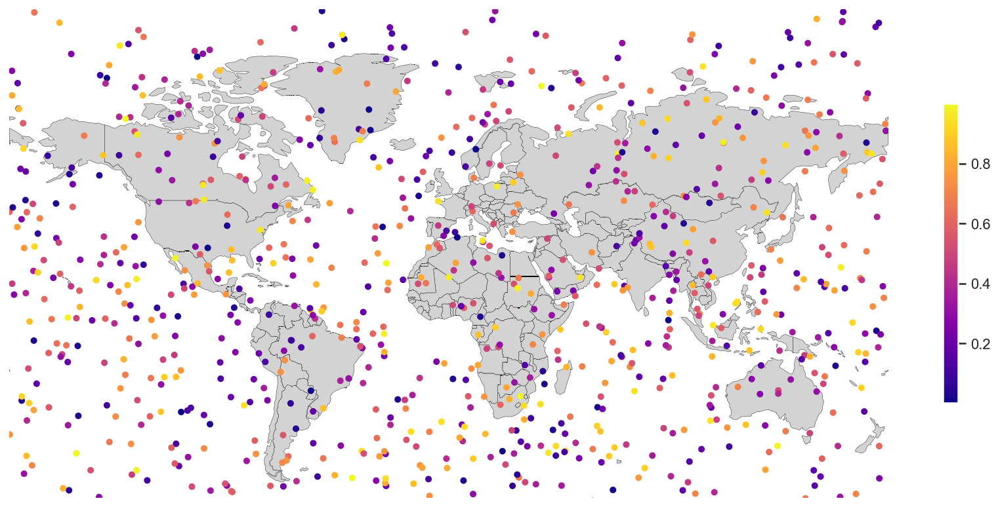

In [31]:
world = gpd.read_file(
    gpd.datasets.get_path('naturalearth_lowres')
)

ax = gplt.polyplot(world, projection=gcrs.Miller(),
                   extent=(-180, -60, 180, 90), figsize=(15, 7), 
                   edgecolor='black', facecolor='lightgrey', linewidth=0.2)


gplt.pointplot(gdf,
    projection=gcrs.Miller(),
    scheme=None,
    hue='val', cmap='plasma',
    ax=ax, zorder=10, s=4,
    extent=(-180, -60, 180, 90),
    legend=True,
    legend_kwargs=dict(shrink=0.6)
              )

ax.set_facecolor('white') ;

/Users/kmt/miniconda3/envs/maps/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


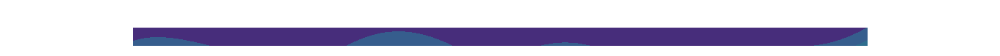

In [45]:
ax = gplt.kdeplot(
    gdf, cmap='viridis', projection=gcrs.Miller(), figsize=(12, 12),
    shade=True,
    clip=world,
    alpha=1,
    #shade_lowest=True,
    bw_adjust=0.5
)
gplt.pointplot(gdf, s=1, color='black', projection=gcrs.Miller(), extent=(-180, -60, 180, 90), ax=ax) ;

/Users/kmt/miniconda3/envs/maps/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


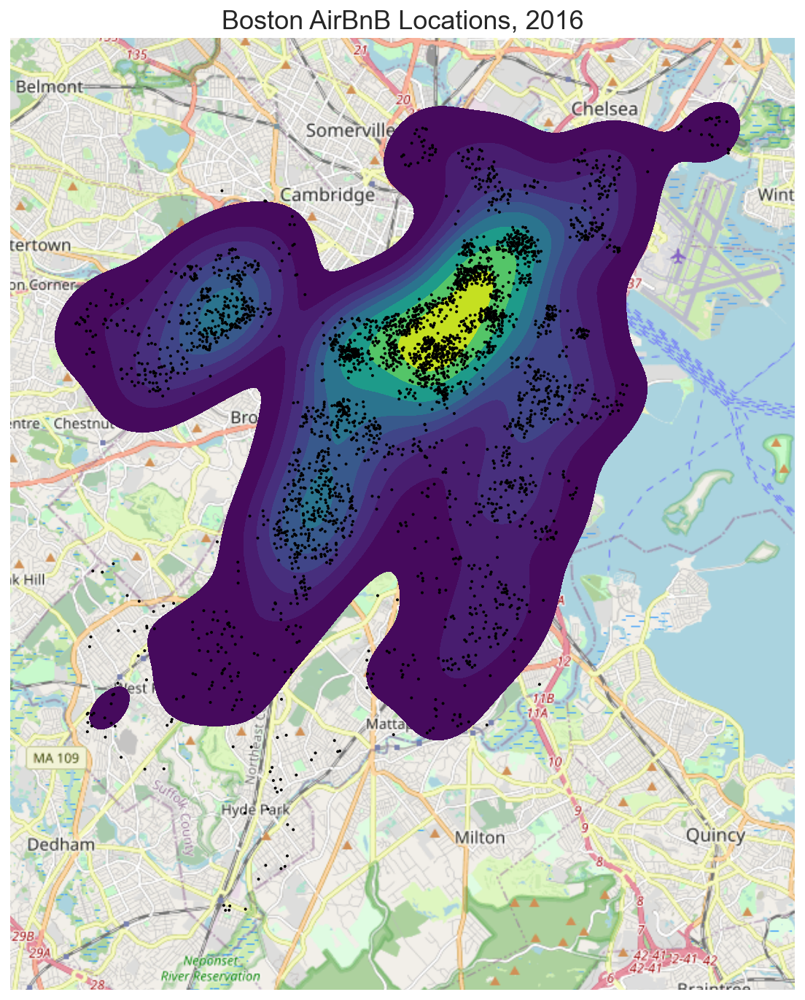

In [33]:
boston_airbnb_listings = gpd.read_file(gplt.datasets.get_path('boston_airbnb_listings'))

ax = gplt.kdeplot(
    boston_airbnb_listings, cmap='viridis', projection=gcrs.WebMercator(), figsize=(12, 12),
    shade=True
)
gplt.pointplot(boston_airbnb_listings, s=1, color='black', ax=ax)
gplt.webmap(boston_airbnb_listings, ax=ax)
plt.title('Boston AirBnB Locations, 2016', fontsize=18)

fig = plt.gcf()

# Shaded relief

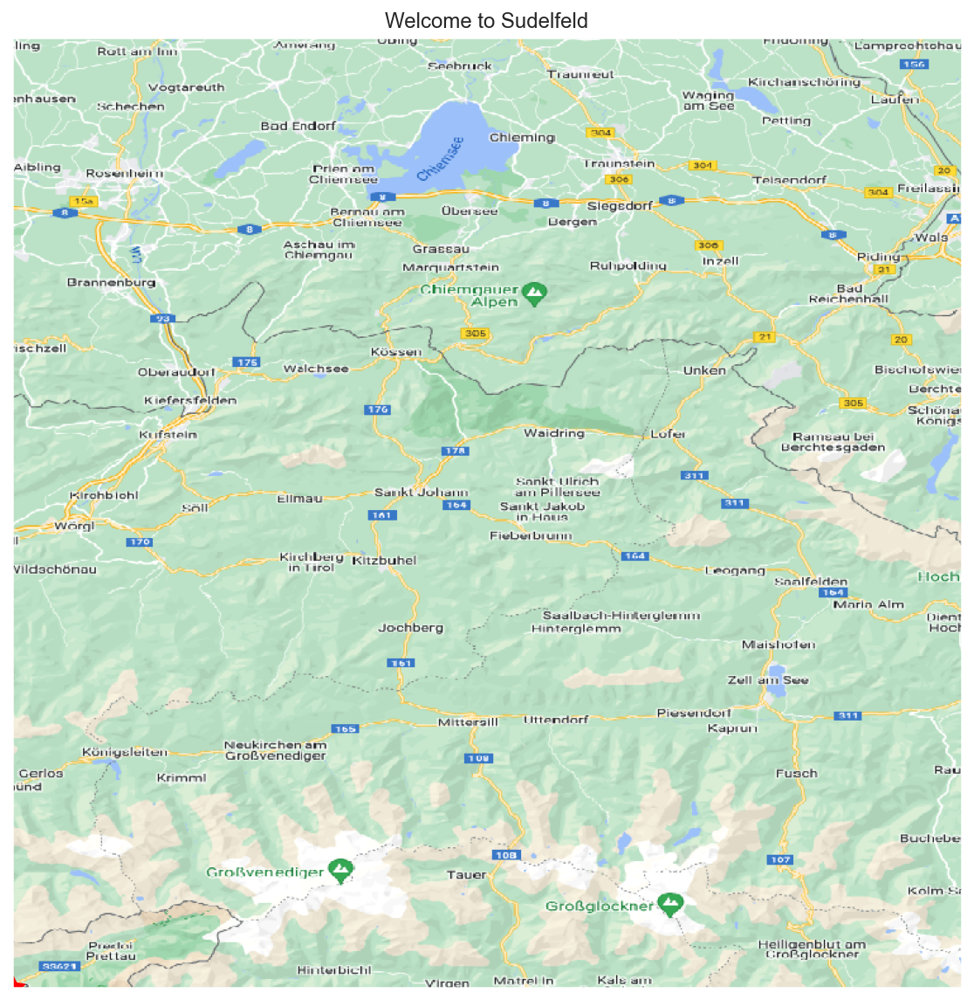

In [61]:
## Subplot 1: Google Maps Tiles
import cartopy.io.img_tiles as cimgt


plt.figure(figsize=(10, 10))
ax = plt.subplot(111, projection=ccrs.PlateCarree())

#ax.set_extent([0, 30, 60, 45])
ax.set_extent([12.0, 13.0, 47.0, 48.0])

gg_tiles = cimgt.GoogleTiles()
ax.add_image(gg_tiles, 10)

plt.scatter(12, 47, marker=(5, 1), color='red', s=200)
plt.title("Welcome to Sudelfeld") ;

NB: Requres earch data login: `https://urs.earthdata.nasa.gov/new` and the code below to add the authentication:

In [35]:
from http.cookiejar import CookieJar
from urllib.parse import urlencode
import urllib.request

# The user credentials that will be used to authenticate access to the data

# The url of the file we wish to retrieve

#url = "http://e4ftl01.cr.usgs.gov/MOLA/MYD17A3H.006/2009.01.01/MYD17A3H.A2009001.h12v05.006.2015198130546.hdf.xml"

# Create a password manager to deal with the 401 reponse that is returned from
# Earthdata Login

password_manager = urllib.request.HTTPPasswordMgrWithDefaultRealm()
password_manager.add_password(None, "https://urs.earthdata.nasa.gov", 'kaspermunch', 'Lappedykker22')

# Create a cookie jar for storing cookies. This is used to store and return
# the session cookie given to use by the data server (otherwise it will just
# keep sending us back to Earthdata Login to authenticate).  Ideally, we
# should use a file based cookie jar to preserve cookies between runs. This
# will make it much more efficient.

cookie_jar = CookieJar()

# Install all the handlers.

opener = urllib.request.build_opener(
    urllib.request.HTTPBasicAuthHandler(password_manager),
    #urllib2.HTTPHandler(debuglevel=1),    # Uncomment these two lines to see
    #urllib2.HTTPSHandler(debuglevel=1),   # details of the requests/responses
    urllib.request.HTTPCookieProcessor(cookie_jar))
urllib.request.install_opener(opener)

# # Create and submit the request. There are a wide range of exceptions that
# # can be thrown here, including HTTPError and URLError. These should be
# # caught and handled.

# request = urllib.request.Request(url)
# response = urllib.request.urlopen(request)

# # Print out the result (not a good idea with binary data!)

# body = response.read()
# print(body)

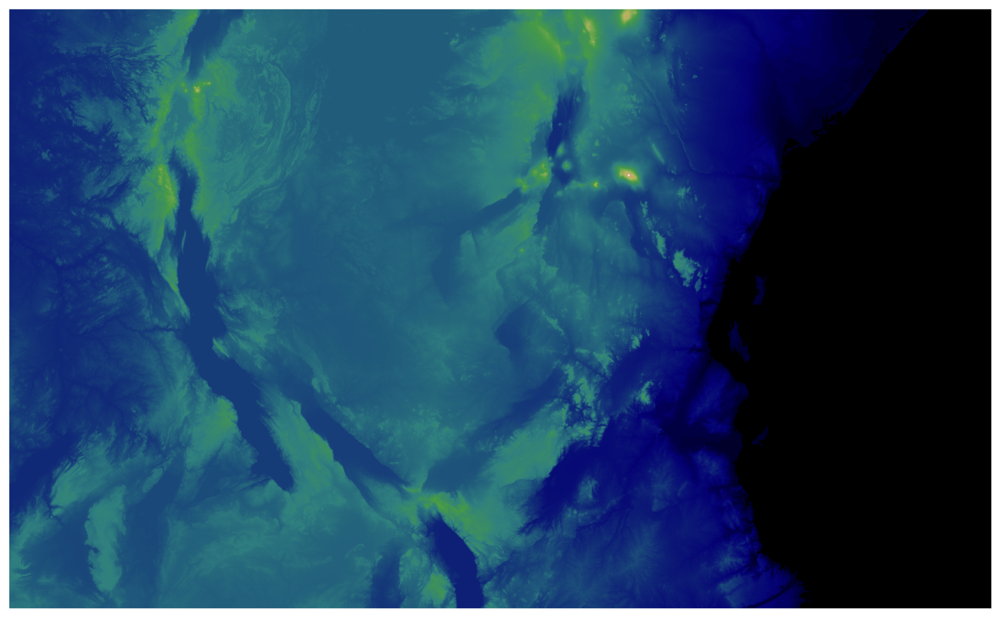

In [36]:
## Subplot 2: STRM Map
#from cartopy.io.srtm import srtm_composite
from cartopy.io.srtm import SRTM3Source


plt.figure(figsize=(15, 10))
ax = plt.subplot(111, projection=ccrs.PlateCarree())

min_lon, max_lon = 26, 44
min_lat, max_lat = -11, 0

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    lon_list = []
    for lon in range(min_lon, max_lon):
        lat_list = []
        for lat in range(min_lat, max_lat):
            elev, crs, extent = SRTM3Source().combined(lon, lat, 1, 1)
            lat_list.append(elev)
        lon_list.append(np.ma.concatenate(lat_list, axis=0))
    elev = np.ma.concatenate(lon_list, axis=1)

extent = (min_lon, max_lon, min_lat, max_lat)    
ax.imshow(elev, extent=extent, transform=crs, cmap='gist_earth', origin='lower') ;

In [37]:
x, y = np.gradient(elev)

slope = np.pi/2. - np.arctan(np.sqrt(x*x + y*y))

# -x here because of pixel orders in the SRTM tile
aspect = np.arctan2(-x, y)

altitude = np.pi / 4.
azimuth = np.pi / 2.

shaded = np.sin(altitude) * np.sin(slope)\
    + np.cos(altitude) * np.cos(slope)\
    * np.cos((azimuth - np.pi/2.) - aspect)

## Shaded relief of East Africa

In [53]:
mycols = sns.color_palette(['#33a02c', '#FFB100', "#8d9da3", '#1f78b4', '#e31a1c', '#b15928'])
mycols_cmap = ListedColormap(mycols.as_hex())
mycols

[(0.2, 0.6274509803921569, 0.17254901960784313),
 (1.0, 0.6941176470588235, 0.0),
 (0.5529411764705883, 0.615686274509804, 0.6392156862745098),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

In [62]:
gdf = gpd.GeoDataFrame(meta_data, geometry=gpd.points_from_xy(meta_data.longitude, meta_data.latitude)).loc[lambda df: df.Species != 'gelada']
gdf.loc[gdf.Species == 'ursinus (grayfoot)', 'Species'] = 'ursinus'

geo_loc = (gdf[['Origin', 'Species', 'Sex', 'geometry']]
           .dissolve(by=["Origin", 'Species'], 
                     aggfunc='count').rename(columns={'Sex': 'nr_samples'})
           .reset_index()
          )
geo_loc

AttributeError: 'DataFrame' object has no attribute 'longitude'

NameError: name 'geo_loc' is not defined

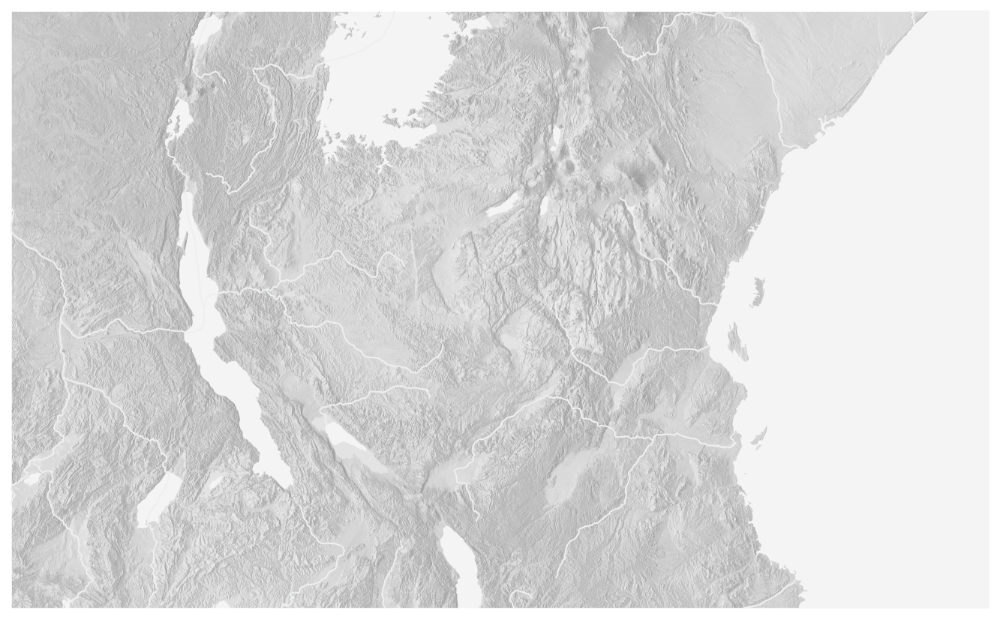

In [59]:
plt.figure(figsize=(12, 12 * (max_lat-min_lat)/(max_lon-min_lon)), 
#             linewidth=10, edgecolor='#33a02c'
          )
ax = plt.subplot(111, projection=ccrs.PlateCarree())

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridisBig = cm.get_cmap('gray', 512)
newcmp = ListedColormap(viridisBig(np.linspace(0.6, 0.95, 256)))

ax.imshow(shaded, extent=extent, transform=crs, cmap=newcmp, origin='lower', zorder=1) 

ax.add_feature(cartopy.feature.LAKES, facecolor='#F4F4F4', linewidth=0, zorder=2)
ax.add_feature(cartopy.feature.OCEAN, facecolor='#F4F4F4', linewidth=0, zorder=3)
ax.add_feature(cartopy.feature.RIVERS, color='#EEEFF0', linewidth=1, zorder=4)
# ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='#939598',
#                                                    facecolor='none',
#                                                    linewidth=1,
#                                                    scale='10m'))

# ax.scatter([30], [-5], s=100, transform=crs, zorder=4)

####################
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import mpl_toolkits.axes_grid1.axes_size as Size

def plot_pie_inset(data,ilon,ilat,ax,width,lon_offset=0, lat_offset=0):
    
    if lon_offset or lat_offset:
        ax.scatter(ilon, ilat, color='black', zorder=50, s=35)

    ax_sub= inset_axes(ax, width=width, height=width, loc=10, 
                       bbox_to_anchor=(ilon+lon_offset, ilat+lat_offset),
                       bbox_transform=ax.transData, 
                       borderpad=0)

    if lon_offset or lat_offset:
        ax.annotate("", xy=(ilon,ilat), xytext=(ilon+lon_offset,ilat+lat_offset), 
                    arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=8, shrink=.1))
    
    wedges,texts= ax_sub.pie(data, 
#                              explode=(0, 0.3, 0), 
                             startangle=0,
                             colors=mycols,
                             wedgeprops={"edgecolor":"black", 'linewidth': 0}
                            )

    ax_sub.set_aspect("equal")

# lon_lat_coords = [(30, -7), (40, -2)]  
lon_lat_coords = [(x, y) for zip(geo_loc.geometry.x, geo_loc.geometry.y)]


                  
pie_lon_lat_coords = lon_lat_coords # get_pie_posistions(lon_lat_coords, ax, k=30, seed=2)
    
for point, pie in zip(lon_lat_coords, pie_lon_lat_coords):
    point_x, point_y = point
    pie_x, pie_y = pie
    plot_pie_inset([0.2, 0.75, 0.05],point_x,point_y,ax,0.6, 
                   lon_offset=pie_x-point_x, lat_offset=pie_y-point_y)
####################
    

plt.savefig('shadedrelief.pdf', bbox_inches='tight')

## Small Africa map with ranges

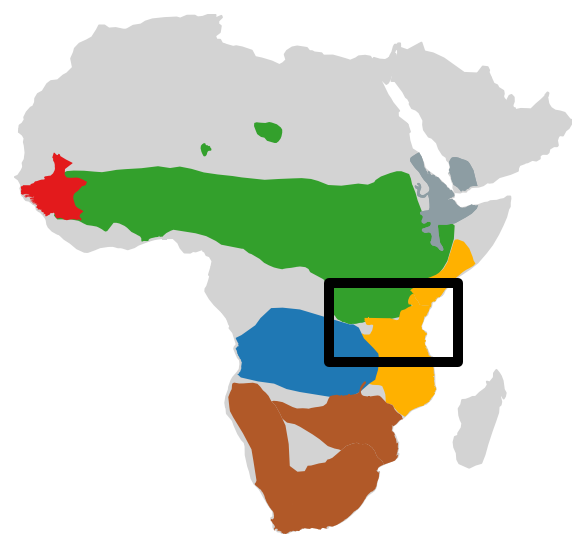

In [105]:
geodata_dir = Path('../baboon_range_data')
ranges_gdf = pd.concat(gpd.read_file(path) for path in geodata_dir.glob('**/*.shp'))

world = gpd.read_file(
    gpd.datasets.get_path('naturalearth_lowres')
)
world.columns

world_midres = gpd.read_file(
    '../natural_earth/50m_cultural/ne_50m_admin_0_countries.shp'
)
world_midres.columns
world_midres['continent'] = world_midres.CONTINENT
world_midres['name'] = world_midres.NAME_EN

# africa = world[world.continent == 'Africa']
africa = world[(world.continent == 'Africa') | (world.name.isin(['Saudi Arabia', 'Yemen', 'Oman', 'United Arab Emirates',
                           'Israel', 'Jordan', 'Qatar', 'Kuwait']))]
africa_midres = world_midres[(world_midres.continent == 'Africa') | (world_midres.name.isin(['Saudi Arabia', 'Yemen', 'Oman', 'United Arab Emirates',
                           'Israel', 'Jordan', 'Qatar', 'Kuwait']))]

plt.figure(figsize=(5, 5))
ax = plt.subplot(111, projection=ccrs.PlateCarree())

ax = gplt.polyplot(africa, ax=ax, facecolor='lightgray', edgecolor='lightgray')
ax.set_facecolor('white')

gplt.choropleth(
    ranges_gdf, hue='BINOMIAL', linewidth=0, scheme=None, 
    ax=ax, extent=africa.total_bounds, cmap=mycols_cmap, legend=False
) ;


box = Polygon([(min_lon, min_lat), (max_lon, min_lat), 
               (max_lon, max_lat), (min_lon, max_lat)])

ax.add_geometries([box], crs=ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=5) ; 

plt.savefig('small_africa.pdf')

,geometry,pop_est,gdp_md_est
continent,,,
Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",1.306370e+09,2455514
Antarctica,"MULTIPOLYGON (((-61.13898 -79.98137, -60.61012...",4.490000e+03,898
Asia,"MULTIPOLYGON (((48.67923 14.00320, 48.23895 13...",4.550277e+09,32725478
Europe,"MULTIPOLYGON (((-53.55484 2.33490, -53.77852 2...",7.454125e+08,21587850
North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",5.837560e+08,25075988


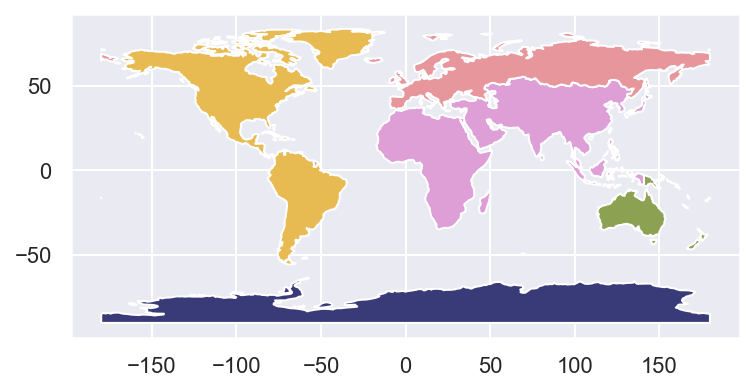

In [114]:
continents = world.dissolve(by='continent', aggfunc='sum')
continents.plot(column = 'pop_est', scheme='quantiles', cmap='tab20b');
continents.head()

In [63]:
# Turn it into geopandas frame

from shapely.geometry import Point, Polygon
from geopandas import datasets, GeoDataFrame, read_file
from geopandas.tools import overlay

africa.plot() ;

NameError: name 'africa' is not defined

[-17, -34, 59, 37]


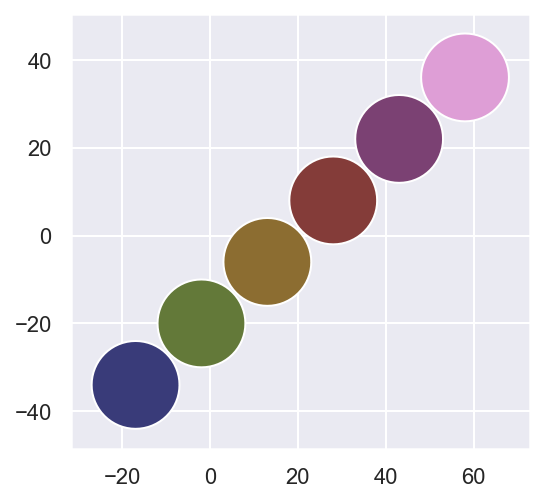

In [88]:
# Generate some circles
b = [int(x) for x in africa.total_bounds]
print(b)
N = 5
polydf2 = GeoDataFrame([
    {'geometry': Point(x, y).buffer(10), 'value1': x + y, 'value2': x - y}
    for x, y in zip(range(b[0], b[2], int((b[2] - b[0]) / N)),
                    range(b[1], b[3], int((b[3] - b[1]) / N)))])
polydf2.plot(cmap='tab20b') ;

`rtree` tree required:

In [89]:
# ! conda install -y -c conda-forge rtree libspatialindex

In [90]:
# ! conda install -y geopandas=0.11

<AxesSubplot:>

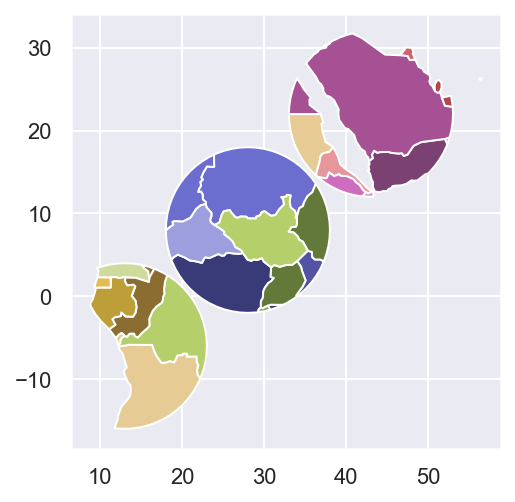

In [91]:
newdf = africa.overlay(polydf2, how="intersection")
newdf.plot(cmap='tab20b')

<AxesSubplot:>

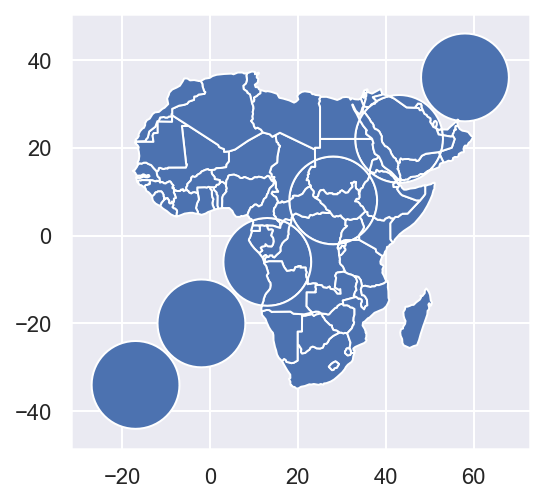

In [92]:
newdf = africa.overlay(polydf2, how="union")
newdf.plot()